# Advanced Color Fixing Part 1

In this multi-part post, we're going to thoroughly review the state of color balance and enhancement. 

1. We're going to go beyond based color perturbations, and learn how to design complex color distortion datasets with our own Look Up Tables (LUTs). This will help us balance more complex scenes, like those with **multi-source colored lighting** and **colorful specular highlights** from artificial light

2. We're going to use HuggingFace's incredible diffusers library to take our ML algorithms into the latent space. We'll learn how to train a fully convolutional network in this condensed space to save on memory and time, and show a how a "color sampling" trick will let us recolor the original high resolution image with what our model learned in "compressed space"

3. We're going to deep dive into the recent paper "**Learning Image-adaptive 3D Lookup Tables for High Performance Photo Enhancement in Real-time**", and learn how to use pytorch's "grid sample" function, as well as GANs, to learn LUTs differentiably

### This project assumes that...

*   You have a strong understanding of basic color theory, including HSV coordinates, as well as basic white balance concepts (the gray world algorithm)
*   You're comfortable with pytorch and fully convolutional neural networks, and you've at least heard of GANs 
*   You're familiar with variational autoencoders, the latent space, and programming with the HuggingFace diffusers library. If not, then you've heard of them, and you'd like to learn more

Although it does not assume you know GIMP, I suggest you download it (for free) and try it out! It will get you through most of your image data needs when you don't feel like writing an entire python script to do something.


### Part 1 Covers

*   Learn the difference between "color balance" and "tone balance"

*   Go beyond torchvision’s “Color Jitter”, and create datasets with 1D and 3D LUTs that allow our machine learning algorithm to remove complex lighting effects (sunsets, instagram filters, and mixed lighting imbalances)

*   Learn about simple "general" enhancing LUTs like Nikon Z6, and Kodak 2838 LUT that can help enhance our ML algorithm's output



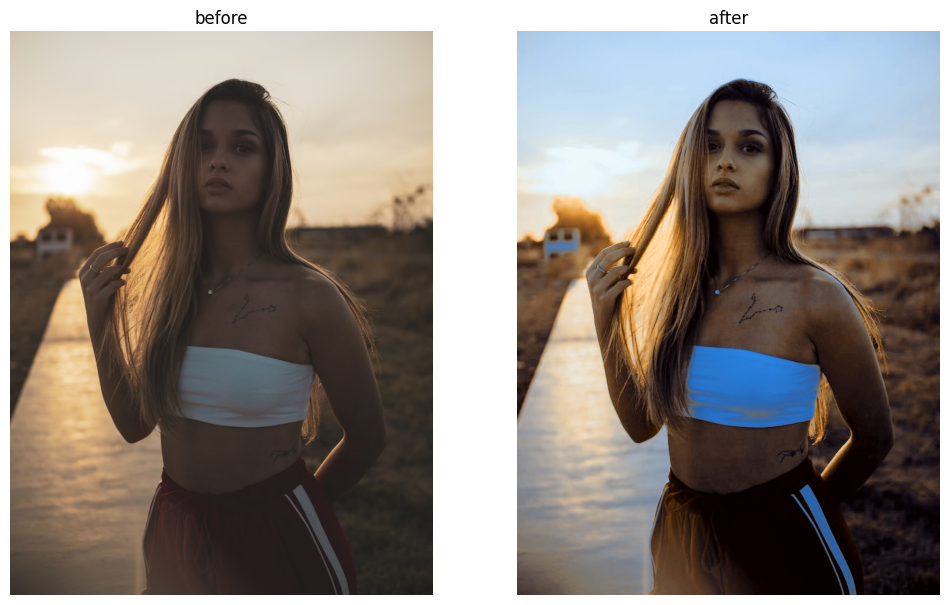

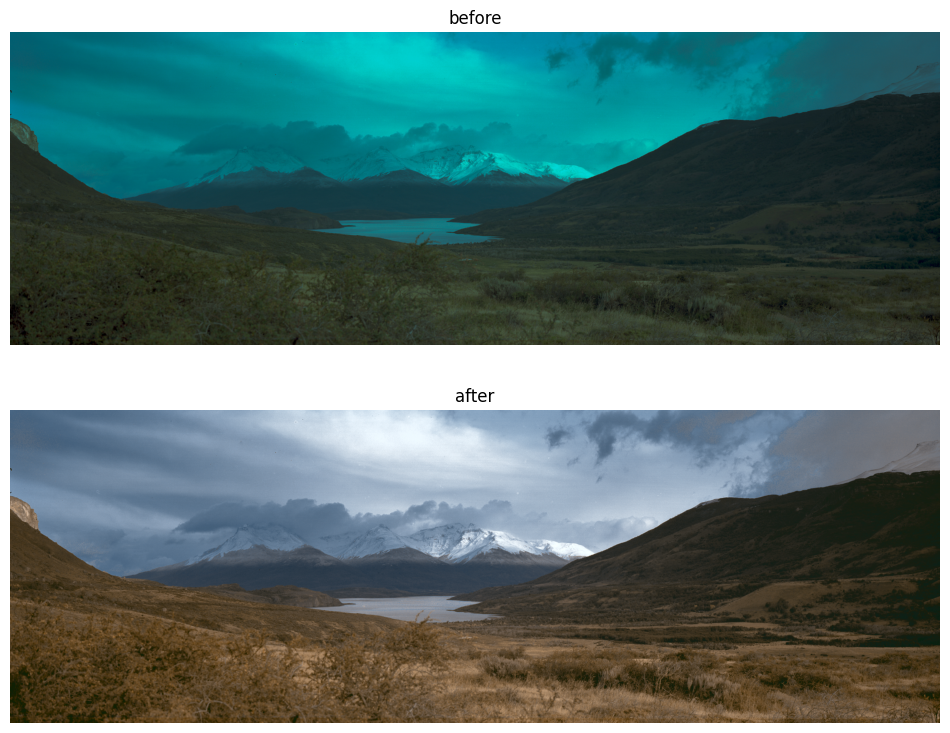

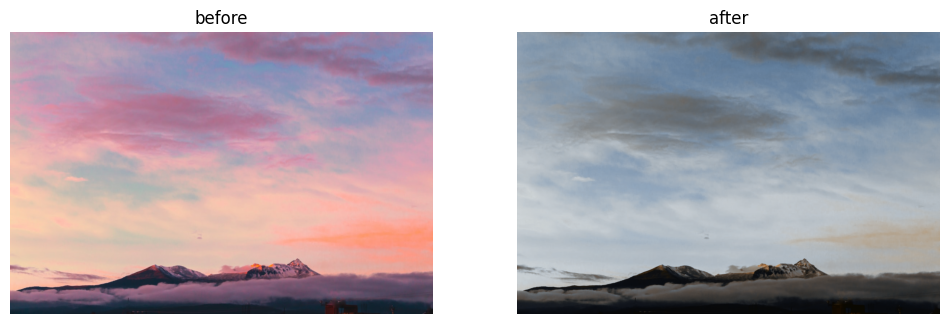

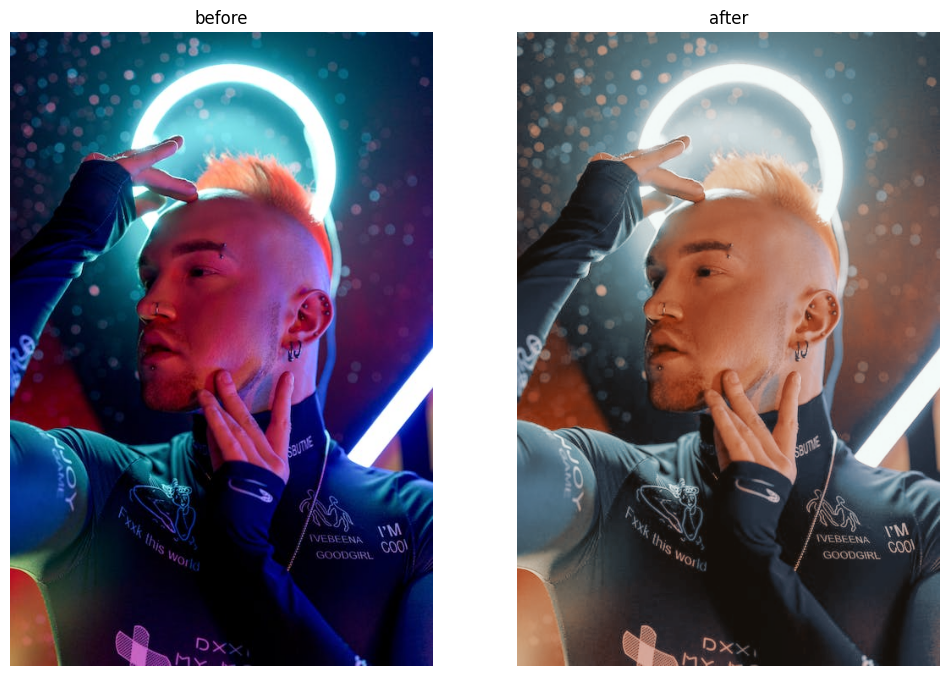

# The State of Image Enhancement

I am a camera engineer who spends a lot of time working on high resolution images. I work on a range of computer vision subjects, but my favorite subject in all of image science is color. Color enhancement is fun to work on because of the large amount of well-designed photoshop tools out there. I am a drab, data-oriented python developer, but for a few hours a day, I can open GIMP and feel like I am an artist. I am always humbled by the amount of image processing expertise there is in the movie, game and animation fields, and I like to haunt their subreddits to learn more about color spaces, image correction, and aesthetics.

On the machine learning side, color enhancement isn’t as tedious as image classification or feature matching. For one, the machine learning part is kind of easy (uncomplicated architectures will solve this problem). And even if your pipeline isn’t perfect, you are still rewarded by looking at beautiful images all day. Computational photography datasets tend to be high resolution, with vivid colors and diverse subject matters. Although I love robotics as a field, looking at poorly exposed PrimeSense stereo pairs isn’t quite as fulfilling as flipping through peoples’ vacation photos. Color theory is also surprisingly well-founded in both mathematics, and psychology.

## Focus, Color and Exposure

You can really divide image enhancement into 3 categories: focus, color and exposure. Algorithms that perfect these areas are called "3A algorithms", where "A" stands for "Automatic". 

1. __Focus__: sharpness enhancement, autofocus, upscaling, bokeh
2. __Color__: white balance, tone mapping
3. __Exposure__: black level correction, high-dynamic range imaging

Large companies like Google, Facebook, Qualcomm and Samsung hire many algorithm engineers to work on perfecting these pipelines for smartphone cameras, VR headsets and car cameras. This was my first job out of school, before moving on to a more pure computer vision role. Focus and exposure are largely physics based, so the applications of machine learning there are limited: ML hasn't solved a lot of these issues because these algorithms are sensitive to imperceptible details. But color is all data and human perception, so machine learning tends to fluorish there.

And in the center of color balancing is the Fully Convolutional Network (FCN), such as Unet. When you have a good labeled dataset, an FCN and a simple loss function like MSE or Binary Cross Entropy (BCE) will get you through most human perception problems. Even Imagen, arguably the most complex image processing network ever trained, rides on one of these. When you don't have a lot of labeled data, this advice is thrown out the door. You can rely on GANs and something called "unpaired loss", but that isn't the immediate focus of this blog post. Today, we will be designing a supervised dataset to solve tricky color issues.


## White Balance

I want to define some terms here. When people talk about "color balance", they are usually refering to removing the "color temperature" of the ambient light in a scene. Although our minds automatically ignore it, both natural and artificial light has a "color", which distorts the textures in the image. Normal people often describe this effect as "warm" or "cool", but professionals use terms like "fluorescent", "incandescent", or "tungsten". I assume the reader is basically familiar with color temperature, but if not I recommend the Wikipedia article written on the subject. It's very clear, and doesn't contain a lot of advertisements like the websites and blogs you will find when Googling it.

[https://en.wikipedia.org/wiki/Color_balance](https://en.wikipedia.org/wiki/Color_balance)





The girl below is holding what is called a "color checker" chart. These  (surprisingly expensive) foam charts have precise paint on them that can be use to calibrate the color of cameras. The simplest color balance algorithms find an area of the checker chart that "should be" white, and divides out a scalar from the entire image so that this particular area becomes white. In the real world, you won't always have a color checker chart, so instead you assume that all of the colors in your image should in theory average out to gray, and balance based on that. You can read more about this algorithm by googling the "gray world" assumption.

All cameras have software with some way of doing this automatically in 2023, except toy cameras that you might use for a Raspberry Pi, or some robotics cameras that are not optmized for the general population. This kind of calibration can only remove very simple distortions, and unless you drop your phone in a swimming pool or something really bad happens, I would wager that the photos you take do not contain errors that can be corrected with any of these simple algorithms.

Below is the girl before and after my network has been applied. 

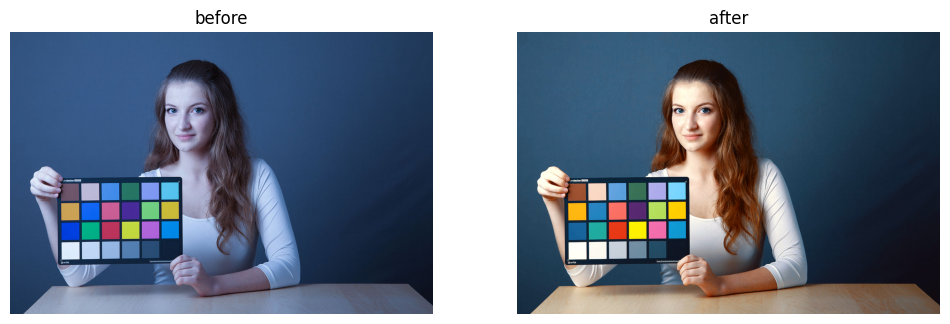

And now, compare to what a simple "gray world" algorithm will find: clearly, the machine learning version outperforms it in terms of being able to find the true white.

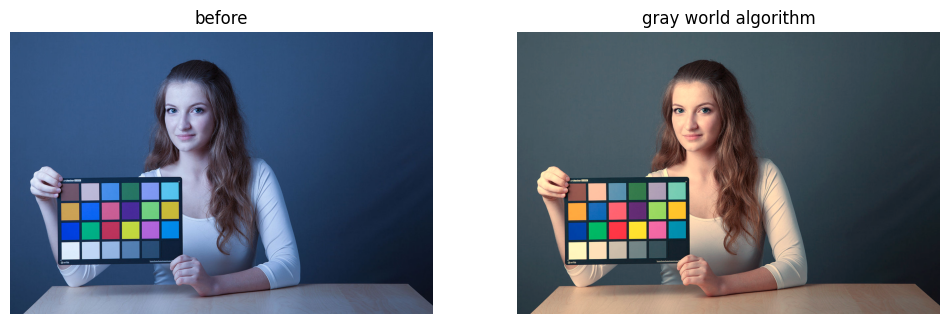

However, below I've posted ground truth, which is taken by actually using the color checker chart to divide out the bad lighting. Overall, I have to admit that the gray world algorithm does better here. Although my neural network can make the whites really pop, it does "too good" of a job: it makes her hair more vivid, and her eyes a deeper blue. My network also makes the background too blue, something that the simple gray world algorithm didn't get tricked by. This is the caveat of using machine learning to solve these problems: sometimes your network will invent colors or textures that aren't actually there. That being said, there are many examples wherre machine learning will greatly outperform any other solution.

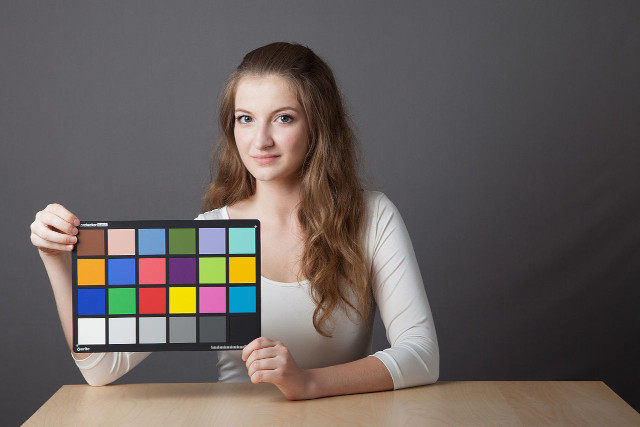

### When Simple White Balance Fails

Even if your image has simple "topical" color issues, auto white balance algorithms can still fail if the distribution of the colors in your image aren't varied enough. The simplest white balance algorithms just choose your gray point as the mean color value, while more advanced color balance algorithms pick gray points from lookup tables based on image content. Here are some simple color correction cases where the gray world algorithm fails, by chance of the distortion being too harsh, or the image content inadequate.



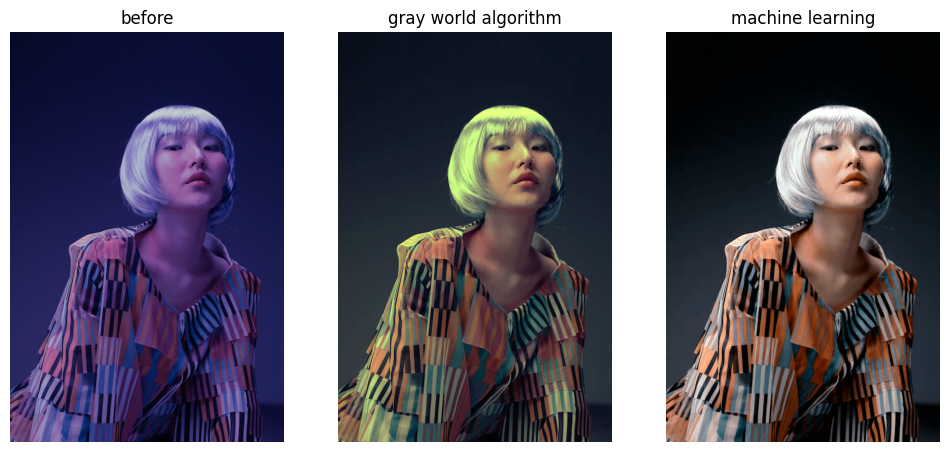

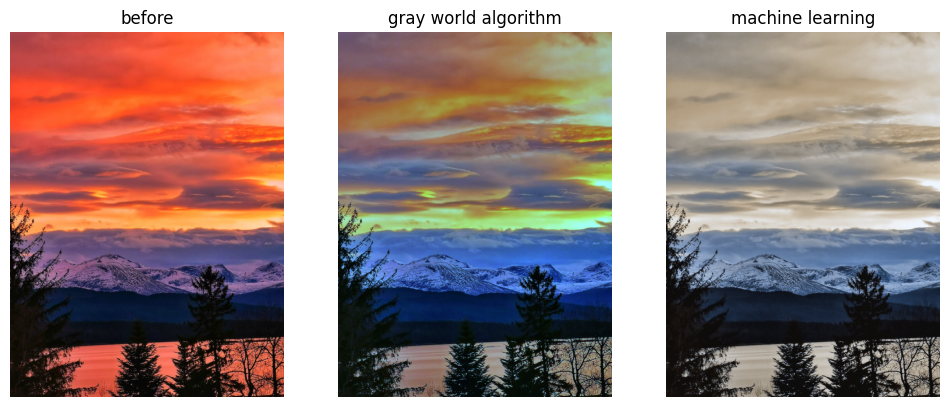

### Mixed + Harsh Colorful Lighting

Often times, multiplying or subtracting out a scalar isn't enough to neutralize the colors in an image. Artificial lighting in particular is hard to get rid of once it is there, because it affects the image locally (the closer to the source, the harsher the lighting), and there can be more than one source of it.

1. In the first image below, a girl in rollerskates sits on the floor of a rink, covered in rainbow lighting. Her face glows purple, her jeans are bathed in green light, and behind her the floor is touched with a red spotlight. The colored lighting is both changing the color of the image's textures, as well as creating specular highlights, but there isn't an image wide "haze" like in the previous photo, so what do we do? What if we wanted to render this image as if she was sitting on a "normally" lit roller rink? Gray world algorithms are insufficient for this task, but machine learning can figure out what normal lighting should look like.

2. The second image in the set below is an alley with neon highlights. Similarly, if we wanted to render this image as if it were a "boring, regular" city at night, we would need a machine learning model that has been trained on these kinds of lighting distortions.

3. And finally the third image, which has a mix of red, green, blue lighting imbalances, as well as being underexposed and oversaturated. It is a very complex image to render neutral, but fortunately our algorithm does a good job.

As a sidenote, there are lots of great images from certain video games and movies I'd love to show off here, but unfortunately we're limited to free images without copyright restrictions here.

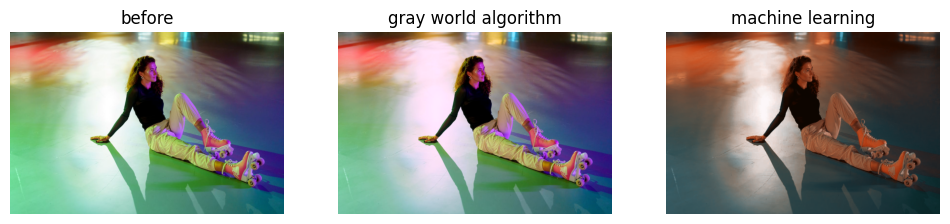

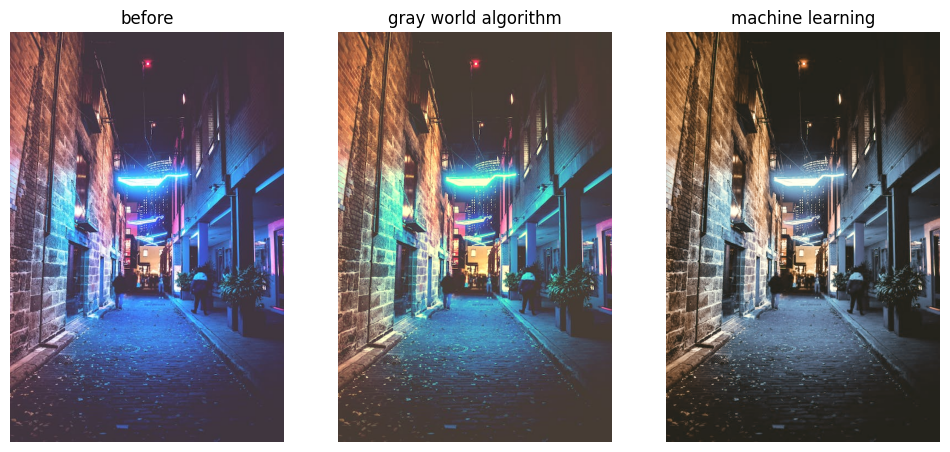

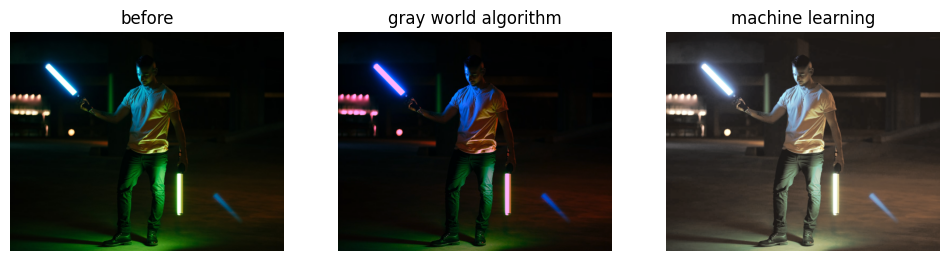

### Intense Highlights

This has been shown off in the previous images, but I wanted to reiterate the problem of intense highlights in fixing colors. Specular highlights oversaturate a certain region of an image where a lot of light is being reflective, and they not easy to get rid without designing a dataset that specifically learns to remove colors only present at higher light levels. In the image below, we can see that a gray world algorithm can remove the overall "pink haze", but not the specular highlights.

I think out of all the areas of color balance, this is the hardest because in the presense of saturating highlights, information about the underlying true color is actually destroyed. There's definitely some room for improvement in my own results here. A dataset that can properly identify this issue would have distortions to actual hue (particularly the hue of faces).



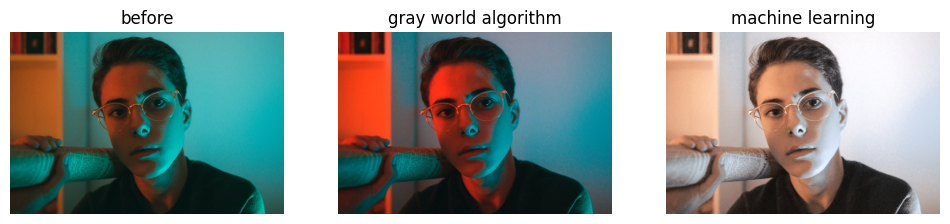

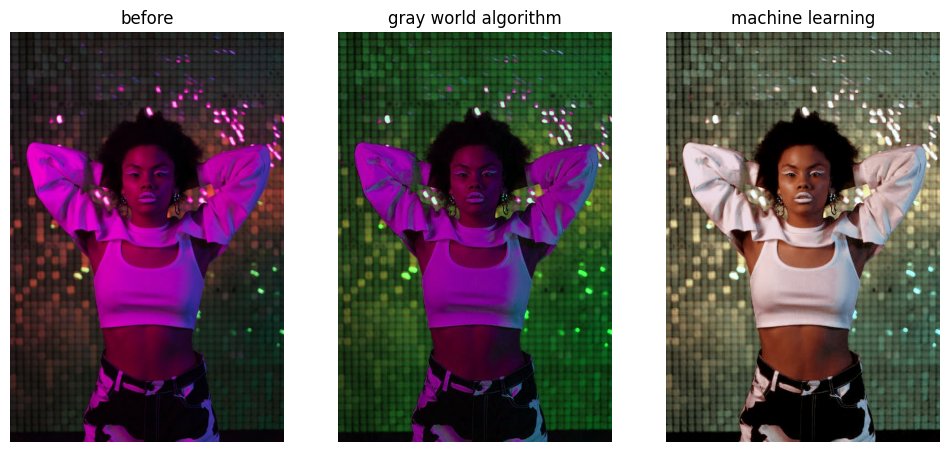

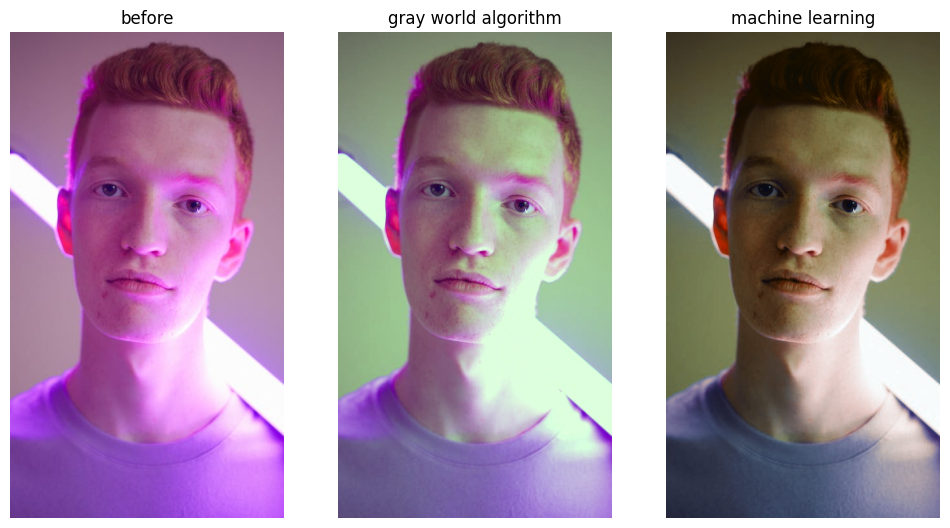

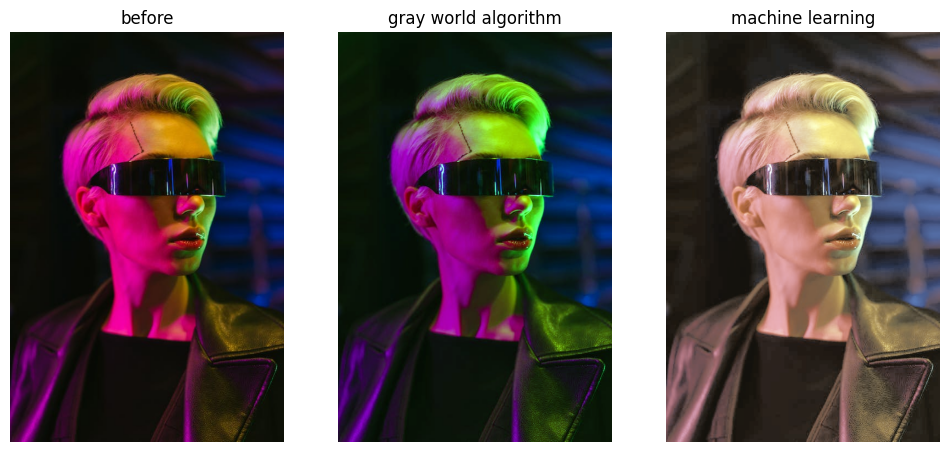

### Faces

Faces are the bane of all color algorithms. As humans, we are extremely sensitive to faces that look "too neutral", which appear zombie like. In other words, we want neutral colors in an image, unless it's a face: then we want warmer colors. This is another strength of machine learning: we can tune our algorithm to make faces appear vivid and healthy. Below are two faces that are well-balanced by "gray world" algorithms, but that look better with a warmer face tone.

Note: overall these faces look nicer than the ones above, because there's more color information about their true skin tone. In the above images, that's largely washed out by the intense highlights.

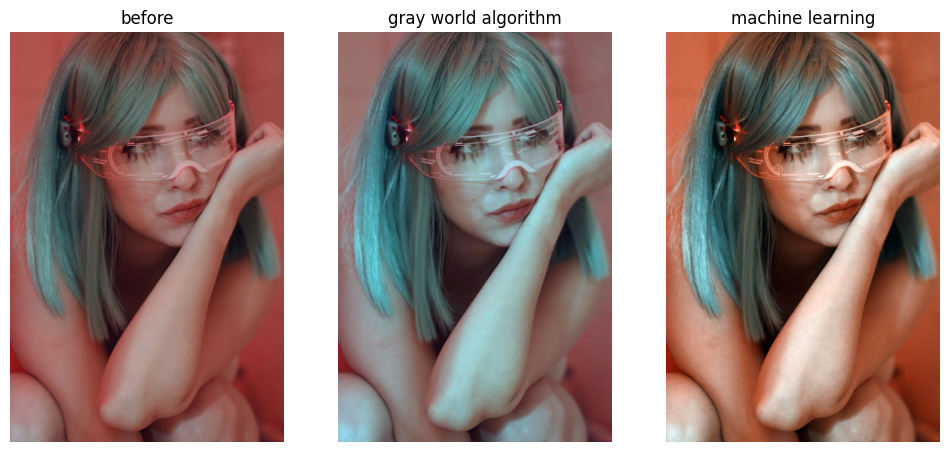

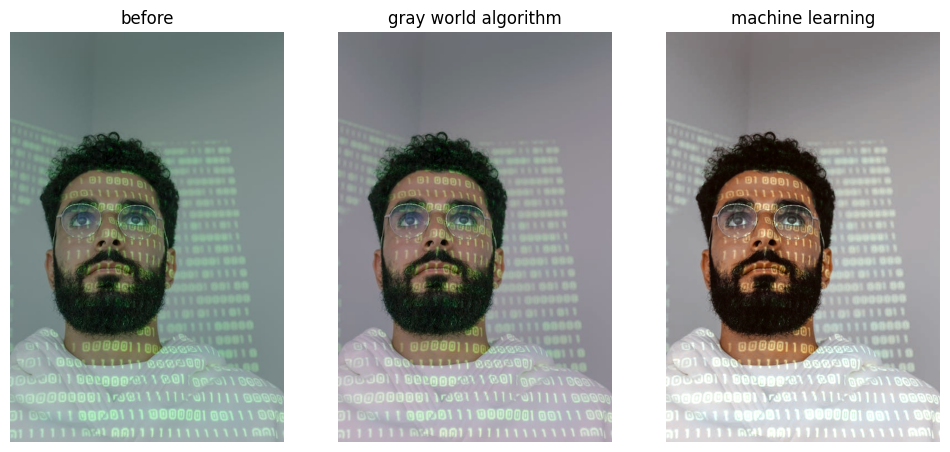

### Instagram / Postprocessing Filters

These are actually particularly easy to remove with machine learning, because often times it was a good photograph to begin with, and so all the information about the true colors is present.

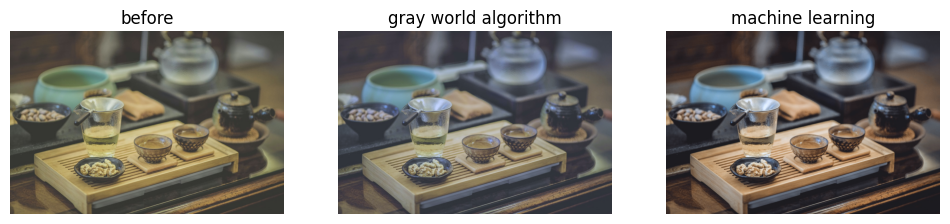

# Going beyond ColorJitter: Dataset Curation with 1D and 3D LUTs


A common way ML engineers create color balance datasets is by randomly multiplying scalars to color channels. A function that will do this in pytorch is called "ColorJitter", which is useful for distorting image. It's a good strategy for adding "underexposed" and "desaturated" images to our dataset, but for simulating color distortion there are some problems:

1. It can only create datasets with images with distotions like in the photograph of the Color Checker girl above. These kinds of color / tone imbalances are uncommon in real photographs because camera software is already so good at removing them
2. It isn't very data efficient. When you're designing a dataset for this purpose, I find you don't need to uniformly approximate all possible color imbalances. Your FCN is smarter than you think it is. You also might undersample images with common distortions like "neon" that you want your network to have a lot of data for.
3. You won't be able to neutralize tones or instagram filters because these distotions affect the shadows, midtones, and highlights separately



The most "state of the art" deep learning algorithms use Look Up Tables, so I've added a somewhat extensive section on how to design datasets and retouch photos with 1D and 3D LUTs. Further down, we will examine how to regress them in machine learning using the pytorch "grid sample" function.


### Look Up Tables (LUTs)

"LUT" stands for Look Up Table. Instead of explaining this concept with words, I've attached an image of editing a lookup table in the popular (free) software GIMP. I've gone to the Colors tab and clicked into the Curves menu, and dragged the middle of the "red" channel up. The "curve"  is a mapping from old intensity (x-axis) to new intensity (y-axis). What this operation has done is map all of the "middle" intensities of red, to a higher intensity. This is a 1D LUT because it is affecting a single channel independently. A 3D LUT is a very complex mapping such that every possible pixel color is mapped to a new one. In cinema, these 3D LUTs applied during postprocessing give each movie its own vibe. Horror movies will map gray values to either blue or green, darken shadows and desaturate faces. Wes Anderson films appear to map gray values to yellow, lighten the overall appearance, increase saturation in oranges and map blue into teal (although it's an ongoing community effort to design the perfect Wes Anderson LUT filters).

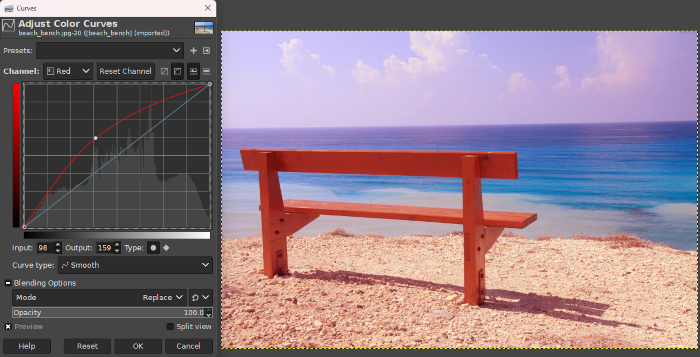

### Playing with 1D LUT curves

As you can see, increasing the red channel alone did not create a convincing "warm" feel to my image. Something that works a bit better is to subtract out blue when you want to create a warm tone, or subtract out red when you want to create a cool tone. In the below image, I've reduced the values of the mid to high level blues, in order to create a warmer look. I've left the darker parts of the blue channel alone, as these are unrelated to "lighting" effects. To create a convincing "neon" look, I would advise to subtract out green and then add in either red or blue. I've modified all the tones slightly, because artificial neon lights tend to change the value of all the pixels in a scene (shadows, midtones and highlights).

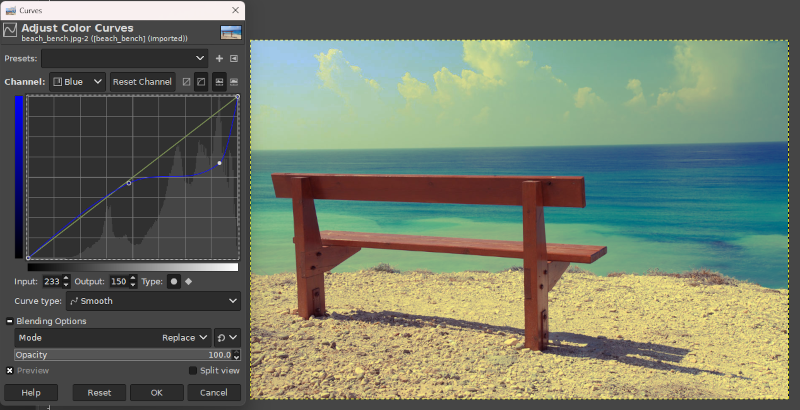

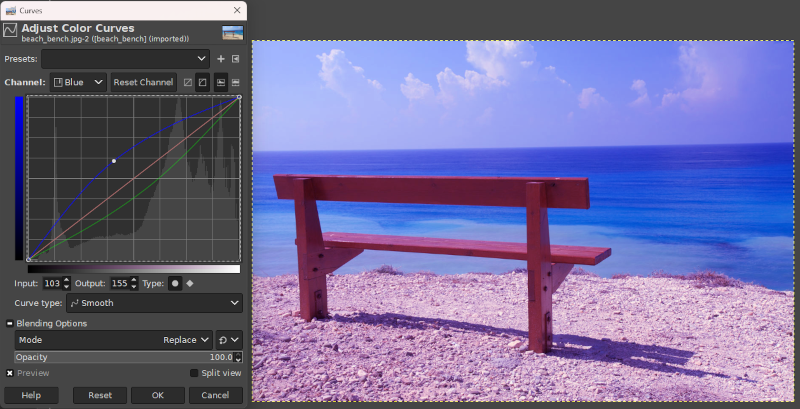

### Contrast

You can use the curves to modify contrast as well, and when creating a dataset, I suggest that you do so, so that your network doesn't just learn to remove all color contarst in the entire image. Noticed I've selected the "value" channel, which corresponds to the lightness/exposure level.

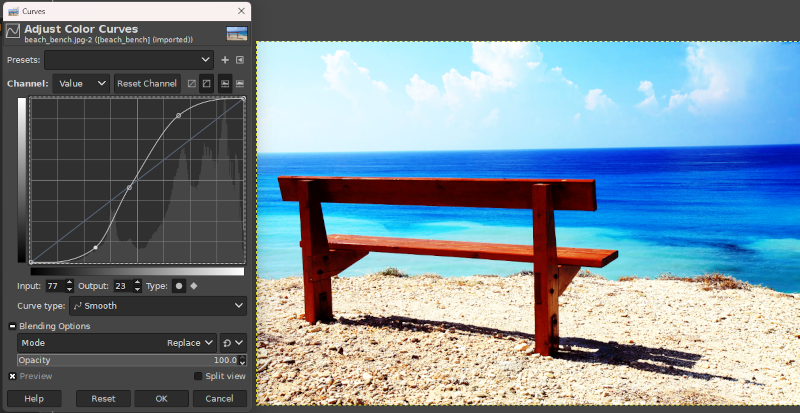

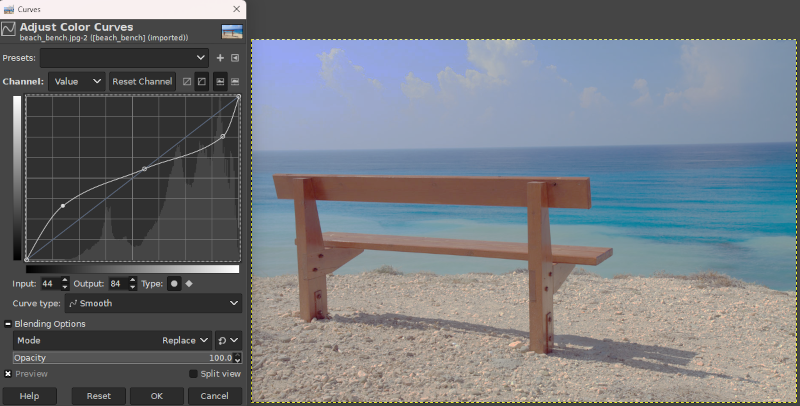

### Saturation and Other Effects

It is impossible to increase or reduce saturation via 1D LUTs, because saturation and hue are functions of all three colors (if you aren't familiar with the terms hue and saturation, I suggest you review the HSV color space). Saturation is easy to work with programmatically: you either decrease it to make the image "less colorful", or increase it to make it "more vivid". Hue, on the other hand, is tricky: changing the fundamental colors of the image is hard to do in a useful way. Do I turn reds into pinks? Yellows into greens? In general, this process is surgical and requires skill. People sell good "color mappings" online for upwards of $20: they are that hard to mine. I'll go over how to create a basic "Teal and Orange" 3D LUT filter, to give you an idea of how they can be used for dataset generation in machine learning.

### Orange and Teal (3D LUT)

"Orange and Teal" is one of the most popular looks that has really taken off in the influencer era. This filter is common in hipster galleries, and a lot of work goes into creating 3D maps that give this hip look, and that can be applied to all images without distorting them. Consider this original image of a girl hiking in an alpine area.


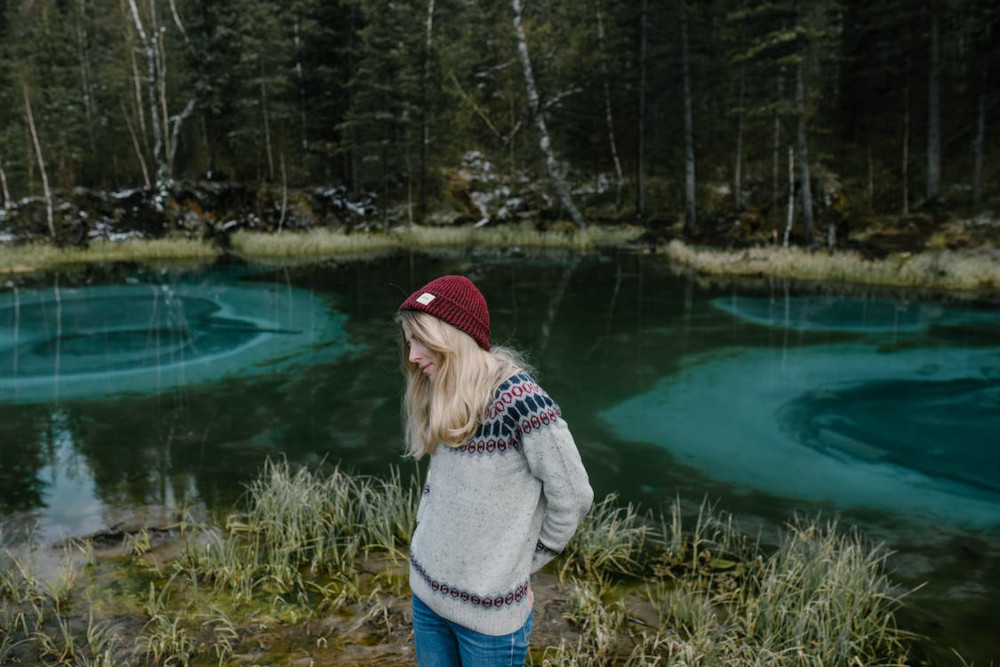


 We're going to start off by going into the Colors tab in GIMP, then select Hue-Saturation. First, we're going to bump up the saturation of the red and cyan channels to the +50% value. Then, we're going to darken the shadows by increasing the black level in the Levels menu (also under the Colors tab). I've changed the value to 10, so that all pixel intensities at or below 10 become black.

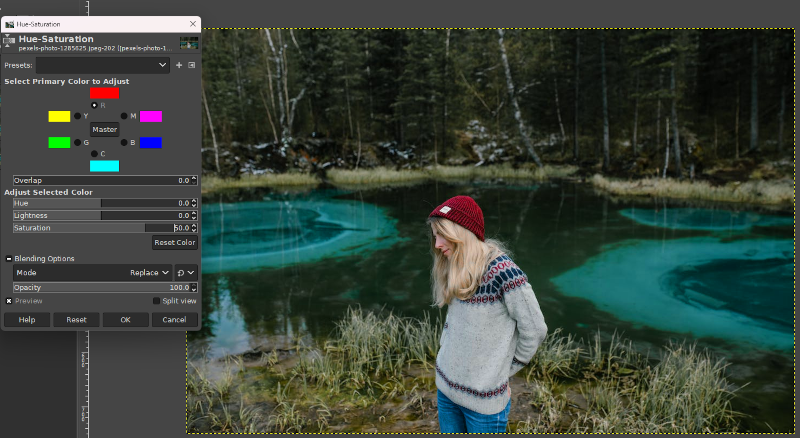

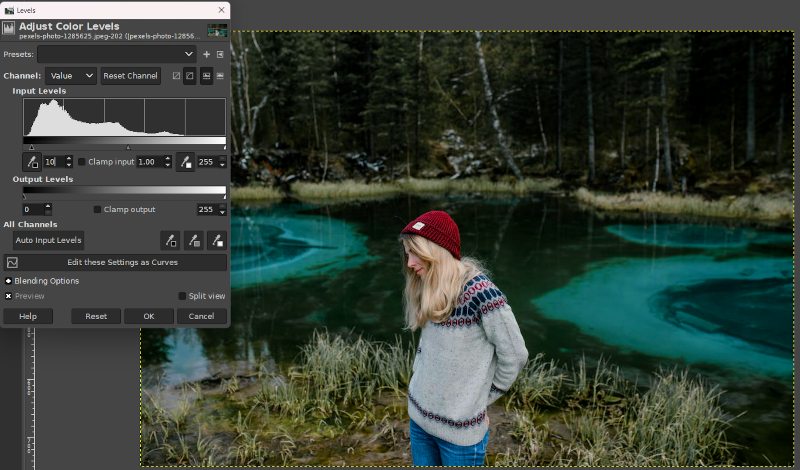

The fix is overall subtle, but that's the point. The important thing to notice is that we could not have retouched this image by just playing with 1D curves, or modifying the images' scalars. Two suggestions for actually designing color retouches that you want to turn into 3D LUT color maps:

1. Use really high quality images with lots of contrast. Images with low bit depth will always look weird when you start messing around with the hues. 

2. I don't suggest using GIMP if you can afford Adobe Photoshop. Increasing the vividness of the red channel made the model's hair and face more pleasant to look at, but now her hat is kind of an eye sore. A properly designed 3D LUT with good tools would be able to increase the colorfulness of hair and face pigments, as well as orange lighting, but leave that hat looking more normal.

Creating datasets of professionally retouched images is much harder than creating datasets of distortions, which is part of what makes the recent paper "**Learning Image-adaptive 3D Lookup Tables for High Performance Photo Enhancement in Real-time**" by Zeng et al so impressive. They take in image as an input, and learn a differentiable color mapping that will retouch said image. I will talk about this paper in more detail later.

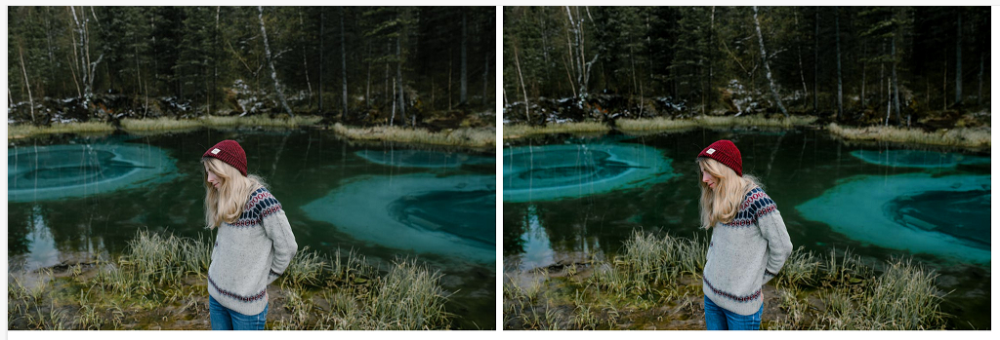

A final thing I want to point out is that increasing the saturation of cyan and red was not arbitrary. We prefer warm, orange faces, so increasing the red saturation levels of any image will make it more pleasing if that image has people in it. People prefer cyan to blue (it looks prettier). However, we did not increase the saturation of greens, because that would give it a "summery" look, and we're going for a "alpine" look. Look what happens if we adjust the saturation of red, green and blue. On the left is our Orange and Teal boost, while the image on the right also increases the saturation in green values by 50%. The green boosted image still looks nice, but the vibrant green on the rim of the lake and exaggerated yellow tones in the woman's hair makes that image look more like it belongs in a "backyard living" catalogue, rather than an adventure blog.

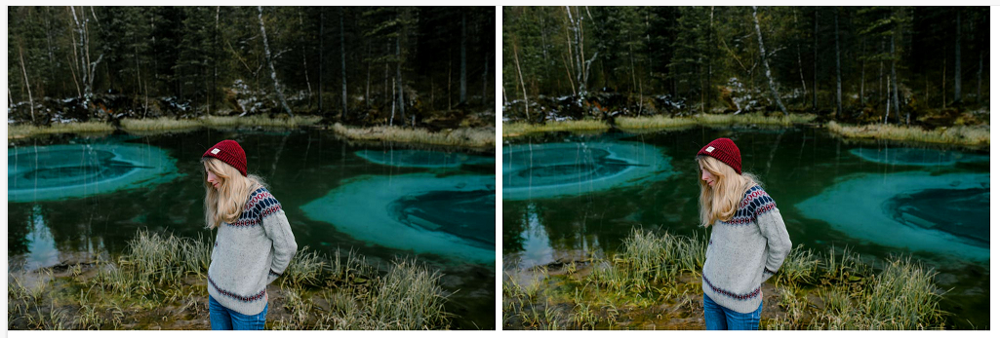

### Saving our LUTs as .cube files

You can turn any color mapping into a .cube file (which can be applied to any image) using a HALD clut file. You can download one at:

[https://sirserch.github.io/lut-creator-js/](https://sirserch.github.io/lut-creator-js/)


These weird looking images contain every possible color (to some resolution). Distort the colors in this file using whatever you want (python, GIMP, Photoshop), and simple scripts can turn them into .cube files for you, which can apply your color mapping to any image. I would suggest following the instructions for this on this page. You don't need to download any software in order to do this, although Googling how to create LUTs will give you lots of spammy advertisements I suggest you avoid. The open github project I've linked below let's you download a HAL at three different resolutions, and processes it into a .cube file for you instantaneously, for free.




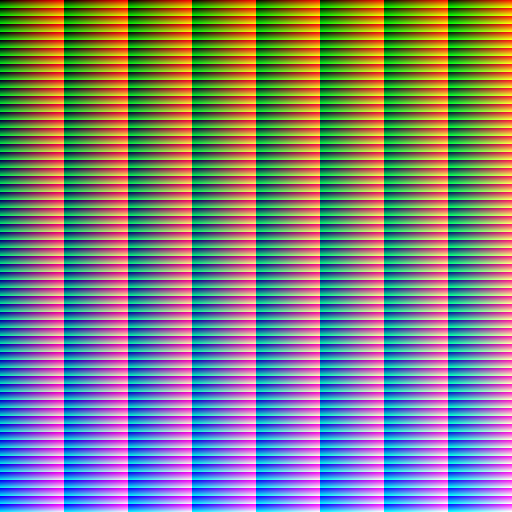

In [ ]:
# To apply our lut file, we can use the pillow-lut library
# found at https://pypi.org/project/pillow-lut/
# 
# A word of caution here: pillow isn't compatible with older versions
# of PIL, which some of the functions we need in HuggingFace's diffusers
# library relies on. I would suggest making a virtual environment with 
# the following script command:
# 
# python3 -m venv lut_env/
# cd lut_env/
# source bin/activate
#
# and perform all of your lutting here.

# In order to apply a LUT file to an image, we can use the 
# following code

from pillow_lut import load_cube_file

image = PIL.open('my_boring_image.png')
lut_file = 'cool_lut_I_made_in_GIMP.cube'
lut = load_cube_file(lut_file)
better_or_worse_image = image.filter(lut)

# "better_or_worse_image" now has whatever changes are dictated in your 
# LUT file, which reflects how you changed your HAL file in GIMP


### Finding LUT's online

Retouching is tedious, and making good LUTs is hard. This example was simple, but if we do the same procedure to every image down to the digits, we won't get good results because this color mapping was only tuned for this exact image. I had an example prepared where I would apply a color map I designed for the alpine lake, to an image of Santorini, but I haven't included it because it looks terrible. Fortunately, there are websites with lots of free LUTs that create a wealth of cinematic effects. I recommend downloading free .cube files at [freshluts.com](https://freshluts.com). You'll have to sign up for a free account, but I've used them for a while and I don't find them sketchy. For dataset generation, I recommend searching them by tint (red, blue, green, magenta, brown), and just downloading a whole bunch of them. 



# Dataset Generation

For my dataset, I taught a network to take a distorted images with mixed lighting effects, and learn either the original image, or an enhanced image. I trained my network on an NVIDIA RTX 3070 GPU, after compressing all of my images into a latent space using a Variational Autoencoder trained by Stability AI for the purposes of Stable Diffusion [sd-va-ft-mse-original](https://huggingface.co/stabilityai/sd-vae-ft-mse-original). I leaned on KL divergence between the encoded distorted image, and the encoded correct image as my loss function, and did not find that I needed a reconstruction error or ELBO loss.

Training in compressed space is easy: with enough parameters, a fully convolutional neural network will converge on these datasets very quickly. The tricky part is to curate your dataset to give you the exact effect that you want. I was able to train for ten minutes, test, rebalance the dataset, and go again thanks to the extreme efficiency offered by Stability AI's VAE.

There are some more details here, but that's for the next part of this post.

### Basic Dataset Curation

I used both custom 1D LUTs, and complex 3D LUTs I downloaded from the internet. I organized them by overall effect and split them into catagories. For each image, I generated a distortion of each category, by randomly selecting one LUT from the list of LUTs in that category. The catagories I chose were simple:

1. Red
2. Blue
3. Green
4. Magenta
5. Brown
6. Saturation (over/under)
7. Contrast (over/under)
8. Exposure (over/under)
9. Weird

The "Weird" category was for special artistic effects, like "horror" or "Wes Anderson", as described above. The LUTs you can make on GIMP are great at "distorting" your images, and I recommend you lean on your own 1D LUTs for things like "green haze", which you won't find on any LUT website, where the LUTs are supposed to make your images look better. However, it is very hard to create brown and yellow 1D LUTs, so I recommend you lean on what other people have done with 3D LUTs for those. I mixed both "heavy" and "subtle" LUTs into my dataset, and I found that this was enough variation to correct virtually all lighting distortions. What is "subtle" and what is "intense" should be obvious upon inspecting the LUT on the website I linked.


As mentioned above, I would also recommend including some exposure and saturation corrections into your set: it is very easy for white balance algorithms to learn how to desaturate an image, or annihilate the contrast, in order to achieve "balance".

Below are some of the images from the time I spent living in Vermont (although on a second glance, I think all those images are technically in New Hampshire). They are distorted with a splatter of LUTs. Notice that some are obviously warm or cool, while others are more complex color mappings. Absent, however, are random colors that wouldn't normally appear in a modern digital photograph, such as you would get by just applying color transformations by distorting images in a python loop.

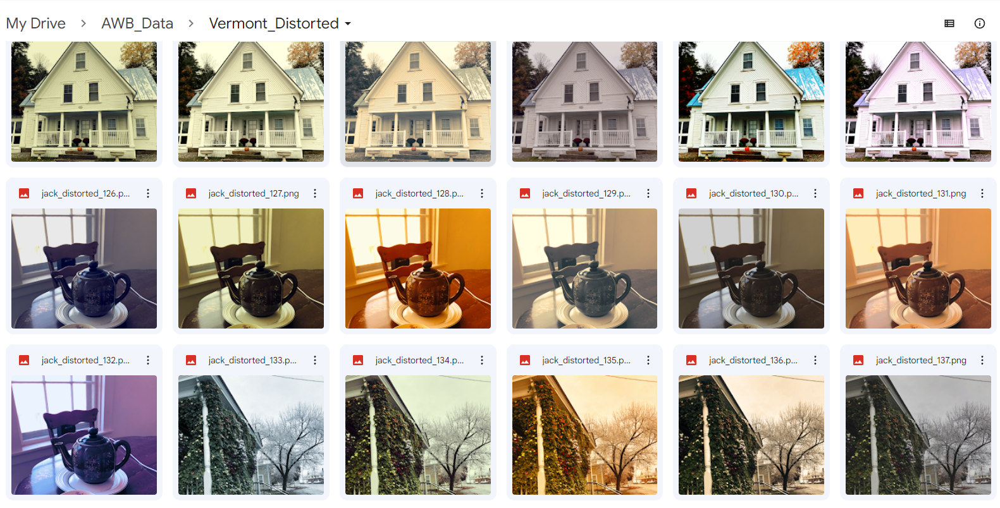

### Where to find your images

I recommend anywhere between 5,000 to 15,000 total images (all distortions included). Although you can get very good results on just 3,000 distorted images created from 500 "true" images. I used images from:

1. **The Ava Aesthetics Dataset**: A public dataset of images curated from DP Challenge. The dataset is [here](https://github.com/ylogx/aesthetics/tree/master/data/ava) , and a paper describing it is [here](http://refbase.cvc.uab.es/files/MMP2012a.pdf) 

2. **MS Coco**: Tried and true, Coco 2017 was also used to train the autoencoder used in this project. The dataset is [here](https://cocodataset.org/#home). Note that as of 2023, the only reliable way to access this dataset is with wget

3. **PPR10K Portrait Dataset**: The only face dataset that I like for this problem, and also a project worked on by the same people who authored the seminal "Learning Image-adaptive 3D Lookup Tables for High Performance Photo Enhancement in Real-time". [Link to the portrait dataset](https://github.com/csjliang/PPR10K) 


# General Enhancement LUTs

Some LUTs are designed to just "generally enhance" an image. There are some really well engineered ones that you can buy at places like [Colorist Factory](https://coloristfactory.com/) that sell LUT packs for upwards of $80. A LUT set like this is designed to have a "grade" for every possible image you could throw at it. Their [blog](https://coloristfactory.com/blog/) is a really great place to learn about professional color design, but be warned: it's a huge step up in complexity from this ammateur article.

One of their LUTs, [Severn](https://freshluts.com/luts/271), is available for free on the website mentioned above, which both enhances images and cools them down. Another is [Nikon Z6](https://freshluts.com/luts/359), which warms them up. Notice that while Nikon Z6 warms faces up more, Severn still warms up the model's face, even though the overall tone it applies is "cool". I used a mix of these LUTs to improve the faces dataset I used to train a network, to prevent skin tones from being "washed out" after balancing the other colors in the image. 

Note: I "deep balanced" the colors of this image before applying the filters, so that both Nikon and Severn would look more natural. If your image is already high contrast or has weird lighting effects, applying an enhancement LUT might make it look weirder. Look at your images in your distorted dataset before you include them :)


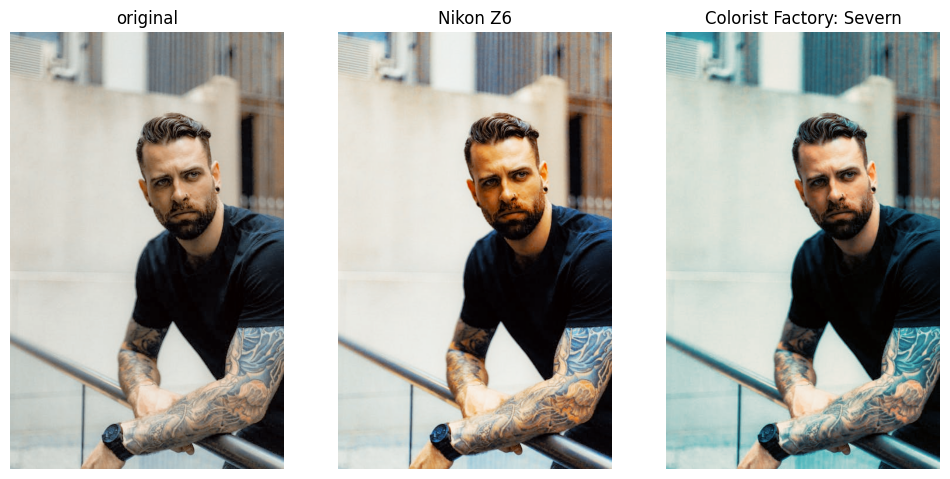